In [383]:
from __future__ import print_function 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import numpy as np
sns.set_style("ticks")

from rdkit.Chem import AllChem, DataStructs

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from rdkit.Chem import PandasTools as pt
pd.options.display.max_columns = None

%config Completer.use_jedi=False

### LoadSDF into Pandas Dataframe without removing Hs

from base64 import b64encode 
import sys 
import types 
import numpy as np 
from rdkit import Chem 
from rdkit import DataStructs 
from rdkit.Chem import AllChem 
from rdkit.Chem import Draw 
from rdkit.Chem.Draw import rdMolDraw2D 
from rdkit.Chem import SDWriter 
from rdkit.Chem import rdchem 
from rdkit.Chem.Scaffolds import MurckoScaffold 
from rdkit.six import BytesIO, string_types, PY3 


from matplotlib.lines import Line2D
import itertools
# from rdkit.Chem import Draw, PandasTools, AllChem, Descriptors, Crippen, DataStructs

# 1. Loading Datasets

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
0,AEUTYOVWOVBAKS-YWVQUKSWNA-O,AEUTYOVWOVBAKS-YWVQUKSWNA-O,,,J,J,ANTIINFECTIVES FOR SYSTEMIC USE,ANTIINFECTIVES FOR SYSTEMIC USE,6,6,ethambutol,ethambutol,1.0,1.0,1.000000,1.0000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,AGOYDEPGAOXOCK-YDSUDHQVNA-O,AEUTYOVWOVBAKS-YWVQUKSWNA-O,,,J,J,ANTIINFECTIVES FOR SYSTEMIC USE,ANTIINFECTIVES FOR SYSTEMIC USE,6,6,clarithromycin,ethambutol,1.0,1.0,0.092409,0.1875,0.2,0.146093,0.099099,0.141989,0.175506,0.184938,0.286258,0.271477,0.345875,0.191268,0.247518,0.228756,0.428121,0.282921,0.0,0.336765,0.52086,0.449778,0.460831,0.314488,0.354027,0.333886,0.265443,0.248037,0.192005,0.224562

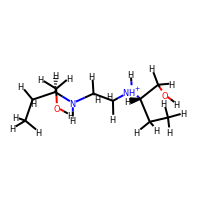
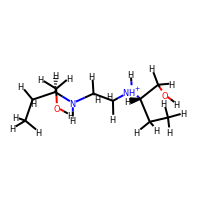
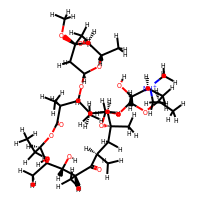
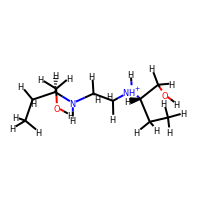

In [5]:
simDF = pd.read_pickle('results_descriptors_benchmark/sim_supervised_mostdilirank.pkl.gz', compression='gzip')
simDF.head(2)

In [17]:
simDF = simDF[simDF.parent_nonstd_inkey_source != simDF.parent_nonstd_inkey_target]

In [18]:
paracetamoldf = simDF[simDF.atc_names_target.isin(['paracetamol', 'acetaminofen'])]

In [34]:
def getsimDF_filtered(simDF, simcutoff, molscutoff, colmetric, colID):
    '''
        simcutoff = 0.2 ## similarity cutoff 
        molscutoff = 5 ## keep 5 first molecules with the highest similarity index
        colmetric = 'Tanimoto'
        colID= 'parent_nonstd_inkey_test'
        
    '''
    sim_sorted_DF = simDF.sort_values(by=[colmetric],
                                      ascending=[False]).reset_index(drop=True)
    sim_sorted_DF = sim_sorted_DF[sim_sorted_DF[colmetric]>= simcutoff]
    sim_filtered_DF = sim_sorted_DF.groupby(colID).head(molscutoff)
    sim_filtered_DF = sim_filtered_DF.fillna(value=0)
#     subframe = sim_filtered_DF[metriccols] 
#     sns.set(font_scale=1.6)
#     cluster_map = sns.clustermap(subframe, figsize=(12, 10), cmap='Greys', vmin=0, vmax=1)
# #     cluster_map.suptitle(testname, fontsize=16)
#     cluster_map.savefig(testname+'_clutermap_fingerprints_'+str(simcutoff)+'.png',bbox_inches="tight")
    return (sim_filtered_DF)

In [8]:
mt = ['jaccard', 'euclidean', 'cosine', 'cityblock']
dnames = ['morganfp','rdkit', 'biofp',
          'morganfp_rdkit','morganfp_biofp',
          'morganfp_rdkit_biofp',
          'rdkit_biofp']

In [41]:
simcutoff = 0.0 ## similarity cutoff 
molscutoff = 10 ## keep 5 first molecules with the highest similarity index
colmetric = 'jaccard_morganfp'
colID= 'parent_nonstd_inkey_target'
simDFsorted = getsimDF_filtered(paracetamoldf, simcutoff, molscutoff,
                                colmetric, colID)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
0,WAEXFXRVDQXREF-NKVPMZBSNA-N,RZVAJINKPMORJF-BGGKNDAXNA-N,,,L,N,ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS,NERVOUS SYSTEM,7,9,vorinostat,paracetamol,0.0,1.0,0.387255,0.285714,0.000000,0.360176,0.329096,0.339286,0.259194,0.469429,0.167712,0.089712,0.146637,0.148701,0.065473,0.091673,0.508738,0.316960,0.0,0.261156,0.122650,0.172665,0.229844,0.703641,0.599513,0.196642,0.598573,0.466276,0.482973,0.415738
1,MKXKFYHWDHIYRV-YAQRNVERNA-N,RZVAJINKPMORJF-BGGKNDAXNA-N,,,L,N,ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS,NERVOUS SYSTEM,7,9,flutamide,paracetamol,1.0,1.0,0.331761,0.232143,0.333333,0.308080,0.327957,0.303347,0.229684,0.397043,0.394225,0.298384,0.449127,0.225588,0.304434,0.273130,0.337753,0.319990,0.0,0.293854,0.514142,0.450098,0.469421,0.640267,0.513213,0.402801,0.566717,0.479594,0.483589,0.383175
2,NHTGHBARYWONDQ-OGJHPINVNA-N,RZVAJINKPMORJF-BGGKNDAXNA-N,,,C,N,CARDIOVASCULAR SYSTEM,NERVOUS SYSTEM,2,9,metirosine,paracetamol,0.0,1.0,0.258814,0.303571,0.000000,0.334014,0.223164,0.316889,0.280560,0.385507,0.747999,0.098595,0.690564,0.141257,0.425172,0.458928,0.413730,0.758513,0.0,0.624582,0.110165,0.362111,0.448631,0.652604,0.834915,0.245703,0.741346,0.450385,0.616926,0.618323
3,NNJVILVZKWQKPM-QIOXDFETNA-O,RZVAJINKPMORJF-BGGKNDAXNA-N,,,Comb,N,COMBINATION,NERVOUS SYSTEM,14,9,lidocaine,paracetamol,0.0,1.0,0.258814,0.321429,0.000000,0.345597,0.223164,0.328087,0.297488,0.275493,0.616821,0.098595,0.593609,0.112879,0.373583,0.398040,0.175587,0.248937,0.0,0.225797,0.027006,0.150457,0.152747,0.570233,0.701713,0.245703,0.627283,0.380681,0.509257,0.499461
4,LKJPYSCBVHEWIU-UWJLXQJCNA-N,RZVAJINKPMORJF-BGGKNDAXNA-N,,,L,N,ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS,NERVOUS SYSTEM,7,9,bicalutamide,paracetamol,1.0,1.0,0.258207,0.196429,0.222222,0.252318,0.250000,0.244898,0.187819,0.310132,0.315000,0.086042,0.457962,0.135928,0.297507,0.228126,0.359308,0.237130,0.0,0.242269,0.349631,0.342462,0.354125,0.522984,0.368825,0.221218,0.458346,0.363921,0.372140,0.261554
5,INWLQCZOYSRPNW-DUTAWSPRNA-O,RZVAJINKPMORJF-BGGKNDAXNA-N,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,mepivacaine,paracetamol,0.0,1.0,0.232456,0.258929,0.000000,0.291570,0.202474,0.276230,0.238239,0.256620,0.355442,0.098595,0.406670,0.107606,0.260110,0.248977,0.166294,0.102670,0.0,0.074942,0.023900,0.074006,0.102286,0.544773,0.556173,0.245703,0.530081,0.358546,0.423878,0.369928
6,UPNUIXSCZBYVBB-DNQVHHGPNA-N,RZVAJINKPMORJF-BGGKNDAXNA-N,,,A,N,ALIMENTARY TRACT AND METABOLISM,NERVOUS SYSTEM,0,9,alvimopan,paracetamol,0.0,1.0,0.229452,0.205357,0.000000,0.241425,0.205729,0.228738,0.187455,0.285275,0.382439,0.098595,0.409064,0.114022,0.258041,0.263643,0.372632,0.281642,0.0,0.210446,0.091497,0.135428,0.193606,0.502360,0.514864,0.245703,0.477448,0.327630,0.371405,0.348574
7,KWTWDQCKEHXFFR-NMFMLDCLNA-O,RZVAJINKPMORJF-BGGKNDAXNA-N,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,tapentadol,paracetamol,0.0,1.0,0.228395,0.321429,0.000000,0.334039,0.197404,0.317077,0.297488,0.371281,0.731205,0.098595,0.666397,0.135600,0.412139,0.452226,0.386706,0.696483,0.0,0.523857,0.097421,0.303689,0.409330,0.627998,0.801084,0.245703,0.704740,0.427655,0.581312,0.594183
8,FFINMCNLQNTKLU-YJHOSDSLNA-L,RZVAJINKPMORJ
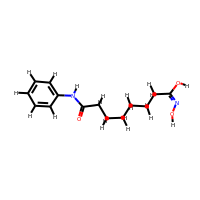
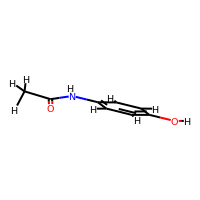
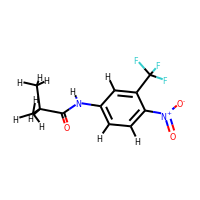
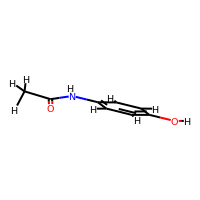
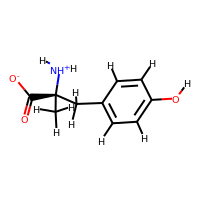
...
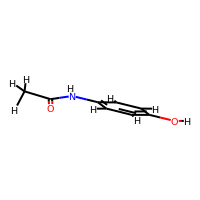
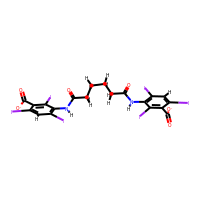
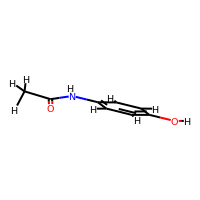
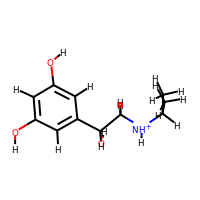
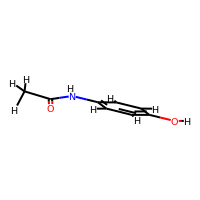

In [42]:
simDFsorted

In [ ]:
simDFsorted[]

# 2. Radialplot

In [363]:
def singleradialplot(df, tnames, simcol):
    '''THIS NEED TO BEEE UPDATED TAKING INTO ACCOUND DILI VALUES'''
    
    labels = df[tnames].values
    stats = df[simcol].values
#     dili = df[dilicol].values
    angles = np.linspace(0.07, 2*np.pi, len(labels), endpoint=False)
    stats = np.concatenate((stats,[stats[0]]))
    angles = np.concatenate((angles,[angles[0]]))
    fig=plt.figure(figsize=(10,20))
    fig.suptitle('Reference: '+refname, fontsize=20, fontweight='bold',
                 x=0.5, y=.75, horizontalalignment='center', verticalalignment='top')
    
#     colors = ["red"] * 31 + ["lightblue"] * 20
#     cmap = matplotlib.colors.ListedColormap(colors)
#     norm = matplotlib.colors.Normalize(vmin=0, vmax=1) 
    
    ax = fig.add_subplot(111, polar=True)
    ax.plot(angles, stats, 'o',  linewidth=2, color='red')
    ax.fill(angles, stats, alpha=0.25, color='red')
    ax.set_thetagrids(angles * 180/np.pi, labels)
    ax.tick_params(pad=35)
    ax.set_rmax(1)
    ax.tick_params(axis='y', which='major', labelsize=14)

    ax.set_rticks([round(i,1) for i in np.linspace(0,1,11)])
    ax.set_rlabel_position(0)
#     ax.set_title('Reference: '+ df.atc_names_target.values[0], loc='right',
#                  fontdict={'fontsize': 16})
    ax.tick_params(axis='x', which='major', labelsize=16, grid_linestyle='-')

    ax.grid(True)
    sns.set_style("white")

In [367]:
def radialplot(compoundf, refname, snames, simcol, dcols):
    fig, ((ax1, ax2),(ax3, ax4),(ax5, ax6),(ax7, ax8)) = plt.subplots(4,2,
                                                                          subplot_kw=dict(projection='polar'),
                                                                          figsize=(15,15))
    fig.subplots_adjust(hspace=0.35, wspace=0.35)

    axes = [ax1, ax2, ax3, ax4, ax5, ax6, ax7]
    sns.set(font_scale = 2.0)
    for i, j in zip(axes,dcols):
        df = getsimDF_filtered(compoundf, 0, 10, simcol+'_'+j, 'parent_nonstd_inkey_target')
        df = df.round(2)
        stats = df[simcol+'_'+j].values
        labels = df[snames].values

        angles = np.linspace(0.07, 2*np.pi, len(labels), endpoint=False)
        stats = np.concatenate((stats,[stats[0]]))
        angles = np.concatenate((angles,[angles[0]]))

        df1 = df[df.vDILI_source == '0.0']
        df2 = df[df.vDILI_source == '1.0']
        i.fill(angles, stats, alpha=0.25, color='grey')

        if len(df.vDILI_source.unique()) == 1 and df.vDILI_source.unique()[0] == '1.0':
            i.plot(angles, stats, 'o',  linewidth=2, markersize=3, color='red')

        elif len(df.vDILI_source.unique()) == 1 and df.vDILI_source.unique()[0] == '0.0':
            i.plot(angles, stats, 'o',  linewidth=2, markersize=5, color='blue')
        else:
            ### positive
            pstats = df2[simcol+'_'+j].values
            pstats = np.concatenate((pstats,[pstats[0]]))
            ### negative
            nstats = df1[simcol+'_'+j].values

            nstats = np.concatenate((nstats,[nstats[0]]))

            p = df2.index.to_list()
            n = df1.index.to_list()
            pangles = []
            for px in p:
                pangles.append(angles[px])
            pangles.append(pangles[0])

            nangles = []
            for nx in n:
                nangles.append(angles[nx])
            nangles.append(nangles[0])

            i.plot(nangles, nstats, 'o', markersize=3, linewidth=2, color='blue')
            i.plot(pangles, pstats, 'o', markersize=3, linewidth=2, color='red')

        i.set_thetagrids(angles * 180/np.pi, labels)
        i.tick_params(pad=35)
        i.set_rmax(1)
        i.tick_params(axis='y', which='major', labelsize=4)

        i.set_rticks([round(i,1) for i in np.linspace(0,1,11)])
        i.set_rlabel_position(0)
        i.set_title(j, loc='right', x=2.0, y=.5, horizontalalignment='center', verticalalignment='top',
                     fontdict={'fontsize': 16, 'fontweight':'bold'})
        i.tick_params(axis='x', which='major', labelsize=10, grid_linestyle='-')

        i.grid(True)
        sns.set_style("white")
        if i == ax7:
            custom_lines = [Line2D([0], [0], color='red', lw=4), Line2D([0], [0], color='blue', lw=4)]
            i.legend(custom_lines, ['positive', 'negative'], loc='center left', title='DILI toxicity',
                      bbox_to_anchor=(3.65, 0.5), frameon=False,
                      fontsize=16)
    fig.delaxes(ax8)
    fig.suptitle(refname+' with '+simcol+ ' similarity', fontsize=20, fontweight='bold',
                 x=0.5, y=1, horizontalalignment='center', verticalalignment='top')
    fig.savefig("figures/radialplot_"+refname+"_"+simcol+".png", bbox_inches="tight")


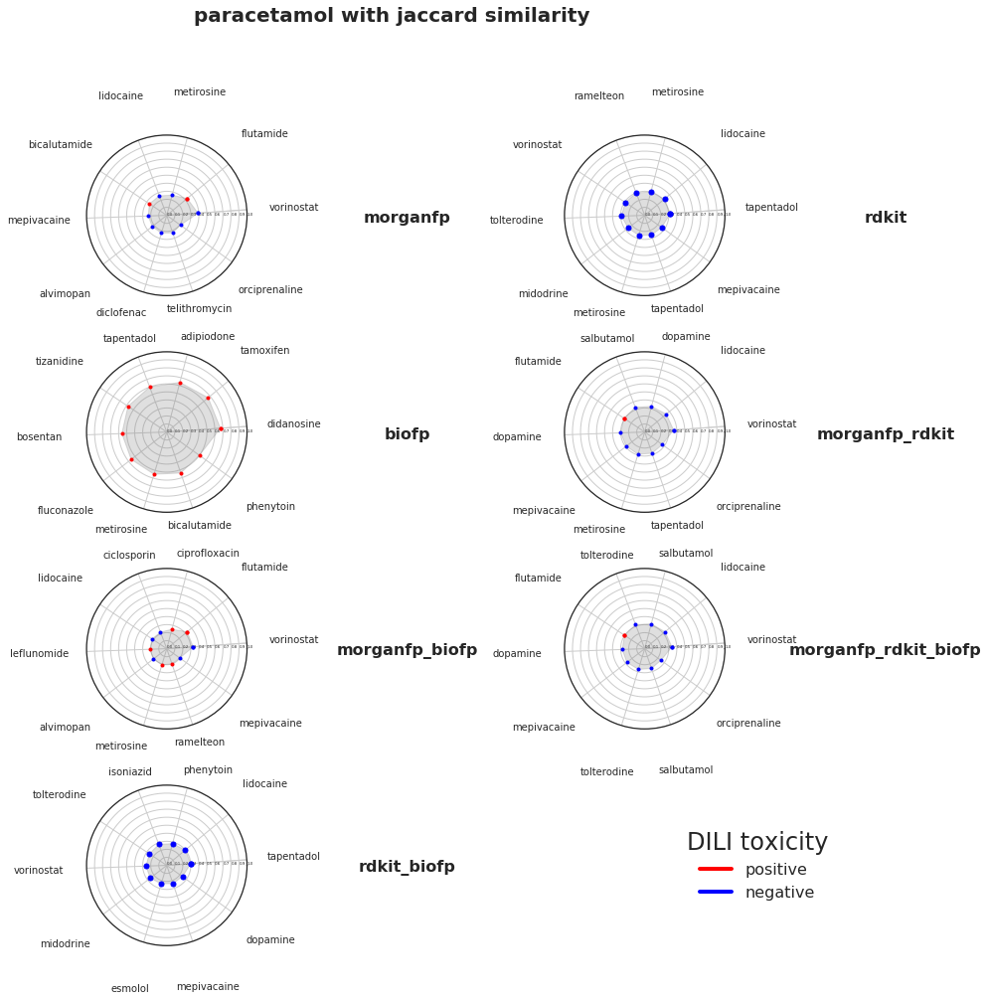

In [368]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
dcols = dnames
refname = 'paracetamol'
compoundf = paracetamoldf
radialplot(compoundf, refname, snames, simcol, dcols)


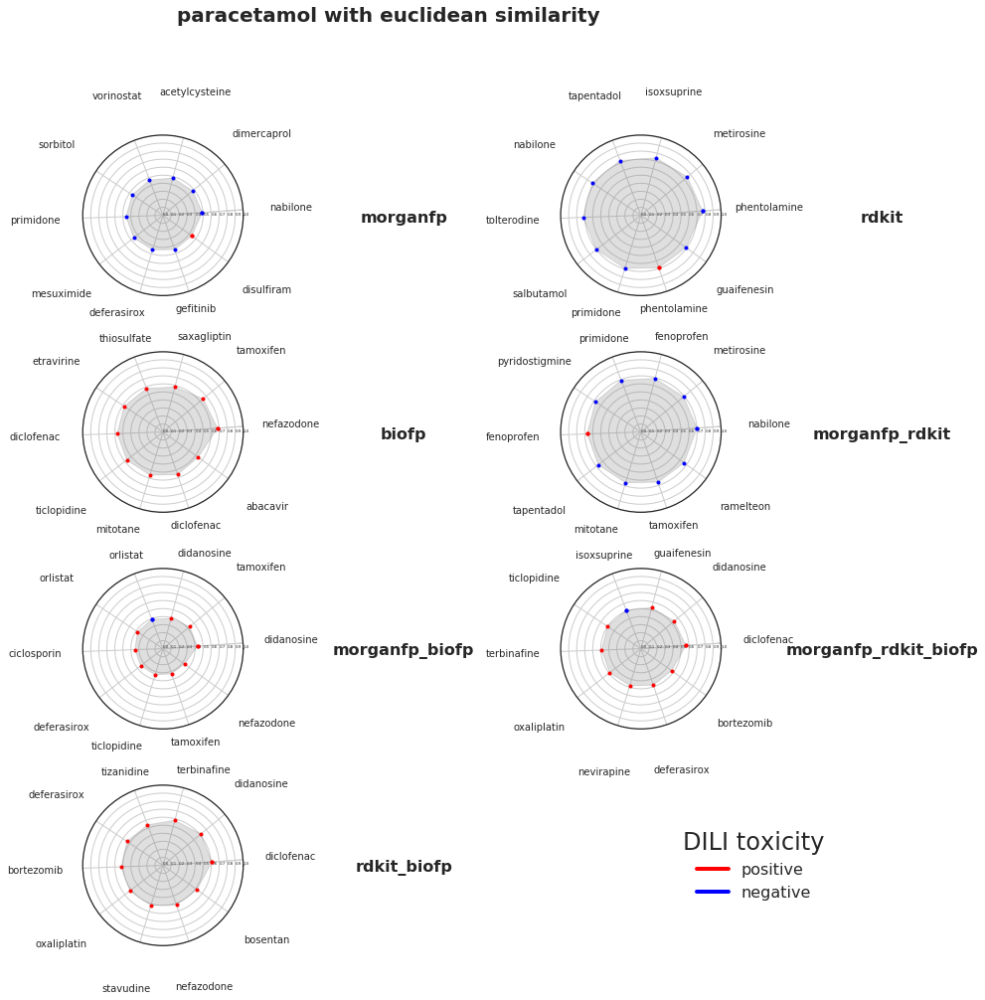

In [369]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'euclidean'
dcols = dnames
refname = 'paracetamol'
compoundf = paracetamoldf
radialplot(compoundf, refname, snames, simcol, dcols)


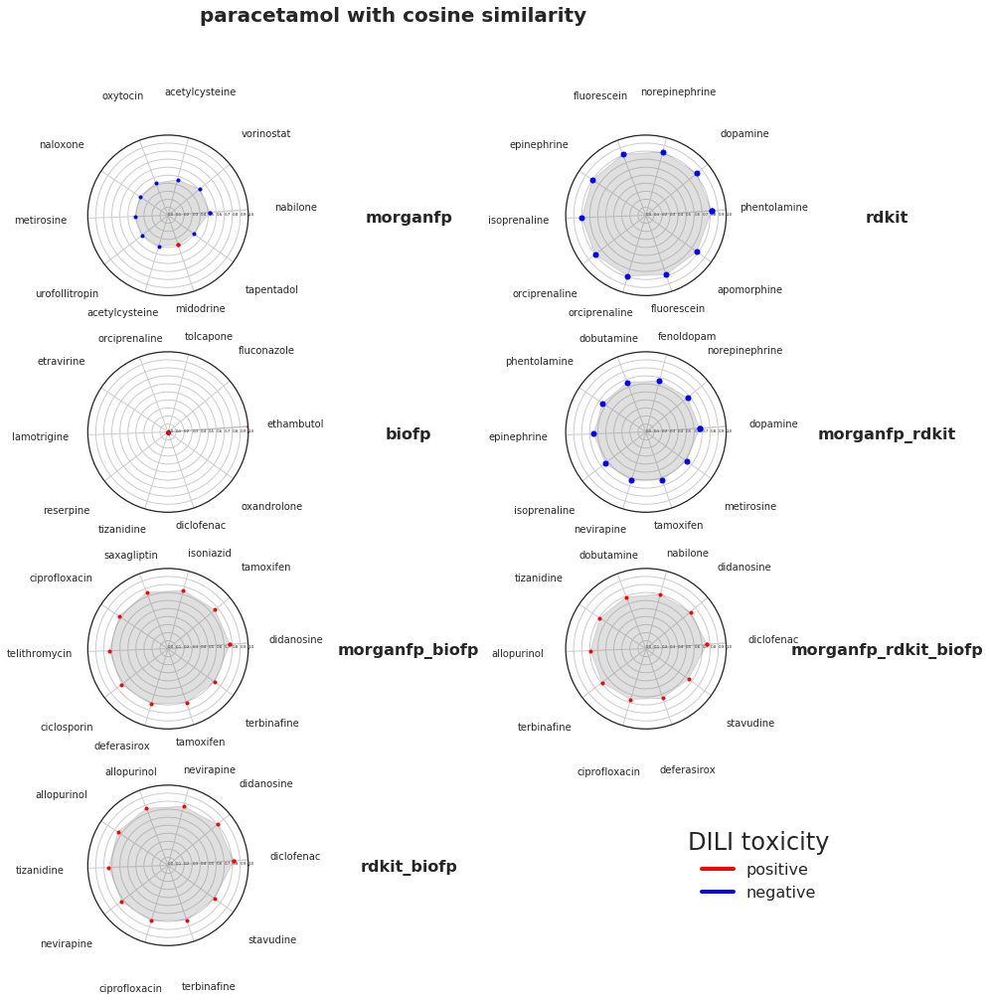

In [370]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'cosine'
dcols = dnames
refname = 'paracetamol'
compoundf = paracetamoldf
radialplot(compoundf, refname, snames, simcol, dcols)


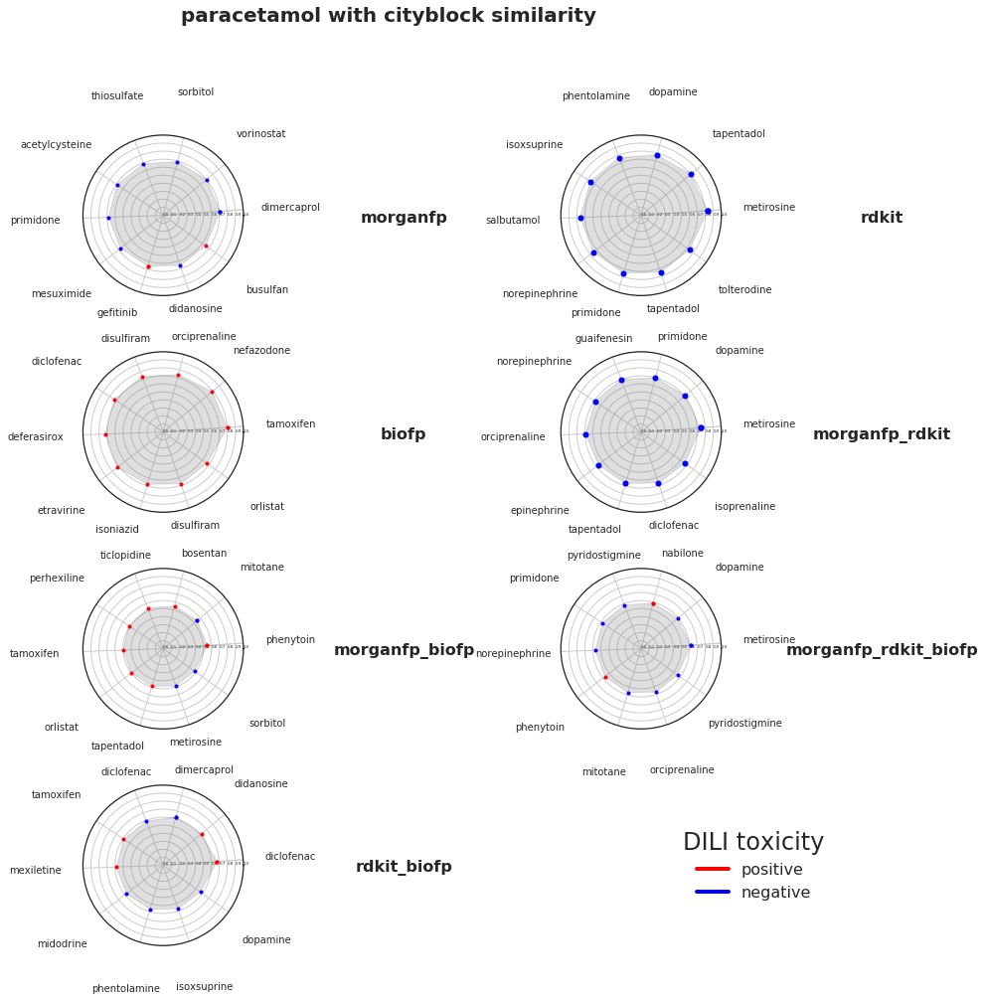

In [371]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'cityblock'
dcols = dnames
refname = 'paracetamol'
compoundf = paracetamoldf
radialplot(compoundf, refname, snames, simcol, dcols)


# 3. Single multi radial plot

In [1553]:
def radialplot(compoundf, refname, snames, dcols):
    fig, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2,2,subplot_kw=dict(projection='polar'),
                                                          figsize=(15,15))
    fig.subplots_adjust(hspace=0.45, wspace=0.15)

    axes = [ax1, ax2, ax3, ax4]
    sns.set(font_scale = 2.0)
    sns.set_style("ticks")
    mypal = ["#e74c3c",'#ff7f0e', '#17becf','#984ea3', '#2ca02c','#b15928',"#000000"]
    sns.set_palette(mypal)
    mt = ['jaccard', 'cosine', 'cityblock','euclidean']
    colors = itertools.cycle(("#e74c3c",'#ff7f0e', '#17becf','#984ea3', '#2ca02c','#b15928',"#000000"))
    sizes = itertools.cycle((16,14, 12,10, 8,6,4))
    markers = itertools.cycle(('o', 'v', '*', '+', '>', '8', 's'))
    for i, simcol in zip(axes, mt):
#         df = getsimDF_filtered(compoundf, 0, 10, simcol+'_'+j, 'parent_nonstd_inkey_target')
        df = compoundf.round(2)
        for j in dcols:
            stats = df[simcol+'_'+j].values
            labels = df[snames].values
            sdili = df.loc[:,'vDILI_source'].values.astype(float)
            sdili= list(sdili)
            sdili = list(map(int, sdili))
#             sdili = int(sdili)
            tdili = df.loc[[0],'vDILI_target'].values.astype(float)
            tdili = int(tdili)

            angles = np.linspace(0.07, 2*np.pi, len(labels), endpoint=False)
#             print (angles)
            stats = np.concatenate((stats,[stats[0]]))
            angles = np.concatenate((angles,[angles[0]]))
#             print (angles)

            df1 = df[df.vDILI_source == '0.0']
            df2 = df[df.vDILI_source == '1.0']
#             i.fill(angles, stats, alpha=0.25, color='grey')
#             color = next(ax._get_lines.prop_cycler)['color']
#             i.fill(angles, stats, alpha=0.25, color=next(colors))
            i.plot(angles, stats, 'o', linestyle='',
                   markeredgewidth=1.2, color= next(colors), markersize=next(sizes))
    
            radians = angles[:-1]* 180/np.pi
            radians = radians.astype(int)
            lradians = []
            for rds, cp in zip(radians, labels):
                lradians.append(str(rds)+'$^\circ$')
            i.set_thetagrids(angles * 180/np.pi, lradians )
            i.tick_params(pad=15)
            i.set_rmax(1.1)
            i.tick_params(axis='y', which='major', labelsize=14)
            i.set_rticks([round(i,1) for i in np.linspace(0,1,6)])
#             i.set_rlabel_position(0)
            i.set_title(simcol, loc='right', x=0.5, y=1.25, horizontalalignment='center', verticalalignment='top',
                         fontdict={'fontsize': 16, 'fontweight':'bold'})
            i.tick_params(axis='x', which='major', labelsize=16, grid_linestyle='-')
            i.grid(True)
            sns.set_style("white")
            if i == ax2:
                h = []
                for k in range(len(labels)+1):
                    h.append(Line2D([0], [0], marker = '', color ='red', linestyle = '', lw=4))
                l = []
                l.append('Ref  :     '+str(tdili)+'       '+refname)
                for rds, cp, tox in zip(radians, labels, sdili):
                    if len(str(rds)) == 1: 
                        l.append('   '+str(rds)+'$^\circ$:\t  '+str(tox)+'\t  '+cp)
                    elif len(str(rds)) == 2:
                        l.append('  '+str(rds)+'$^\circ$:\t '+str(tox)+'\t '+cp)
                    else:
                        l.append(str(rds)+'$^\circ$:\t'+str(tox)+'\t'+cp)
                
                leg = i.legend(labels = l,handles = h,
                               loc='center left', bbox_to_anchor=(1.15,0.5),
                               frameon=False, fontsize=16, title='Compounds plus toxicity')
            if i == ax4:
                h = []
                for color, ss in zip(mypal[:len(dcols)], sizes):
                    h.append(Line2D([0], [0],linestyle = '', color=color, marker='o', markersize=ss))
                legend2 = i.legend(labels = dcols, handles = h,
                                   loc='center left', bbox_to_anchor=(1.25,1.00),
                                   frameon=False, fontsize=16, title='Descriptors')

                
#     fig.delaxes(ax3)
#     fig.delaxes(ax6)
#     fig.suptitle(, fontsize=20, fontweight='bold',
#                  x=0.5, y=1, horizontalalignment='center', verticalalignment='top')
#     fig.savefig("figures/radialplot_"+refname+"_"+simcol+".png", bbox_inches="tight")


# 3.1 Jaccard morganfp Clarithromycin

In [1543]:
kk = simDF.sort_values(by='jaccard_morganfp', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
61719,XNOPRXBHLZRZKH-ORQPBDEFNA-N,ZDRRIRUAESZNIH-OBSLRLEHNA-N,,,H,G,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",GENITO URINARY SYSTEM AND SEX HORMONES,5,4,oxytocin,urofollitropin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
58456,ZDRRIRUAESZNIH-OBSLRLEHNA-N,XNOPRXBHLZRZKH-ORQPBDEFNA-N,,,G,H,GENITO URINARY SYSTEM AND SEX HORMONES,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",4,5,urofollitropin,oxytocin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
49322,SFLSHLFXELFNJZ-HXOWBQAONA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,C,Comb,CARDIOVASCULAR SYSTEM,COMBINATION,2,14,norepinephrine,epinephrine,0.0,0.0,0.821429,0.500000,1.0,0.612155,0.821429,0.613544,0.507271,0.909157,0.952484,1.000000,0.940801,0.948245,0.936759,0.948911,0.988617,0.996835,0.0,0.992532,0.988322,0.989547,0.994663,0.982158,0.972565,1.000000,0.973086,0.984997,0.972821,0.971512
46059,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,SFLSHLFXELFNJZ-HXOWBQAONA-O,,,Comb,C,COMBINATION,CARDIOVASCULAR SYSTEM,14,2,epinephrine,norepinephrine,0.0,0.0,0.821429,0.500000,1.0,0.612155,0.821429,0.613544,0.507271,0.909157,0.952484,1.000000,0.940801,0.948245,0.936759,0.948911,0.988617,0.996835,0.0,0.992532,0.988322,0.989547,0.994663,0.982158,0.972565,1.000000,0.973086,0.984997,0.972821,0.971512
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.9563
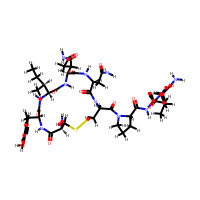
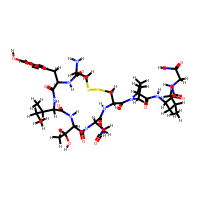
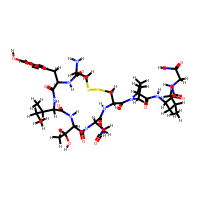
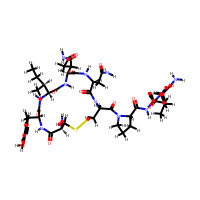
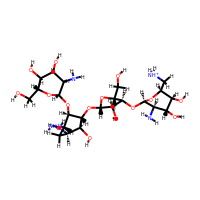
...
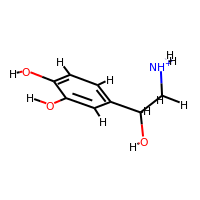
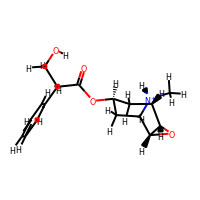
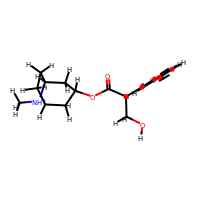
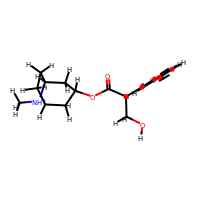
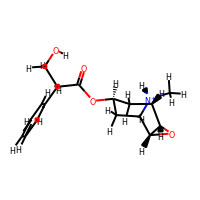

In [1544]:
kk.head(20)

In [1545]:
drugdf = simDF[simDF.atc_names_target.isin(['clarithromycin'])]

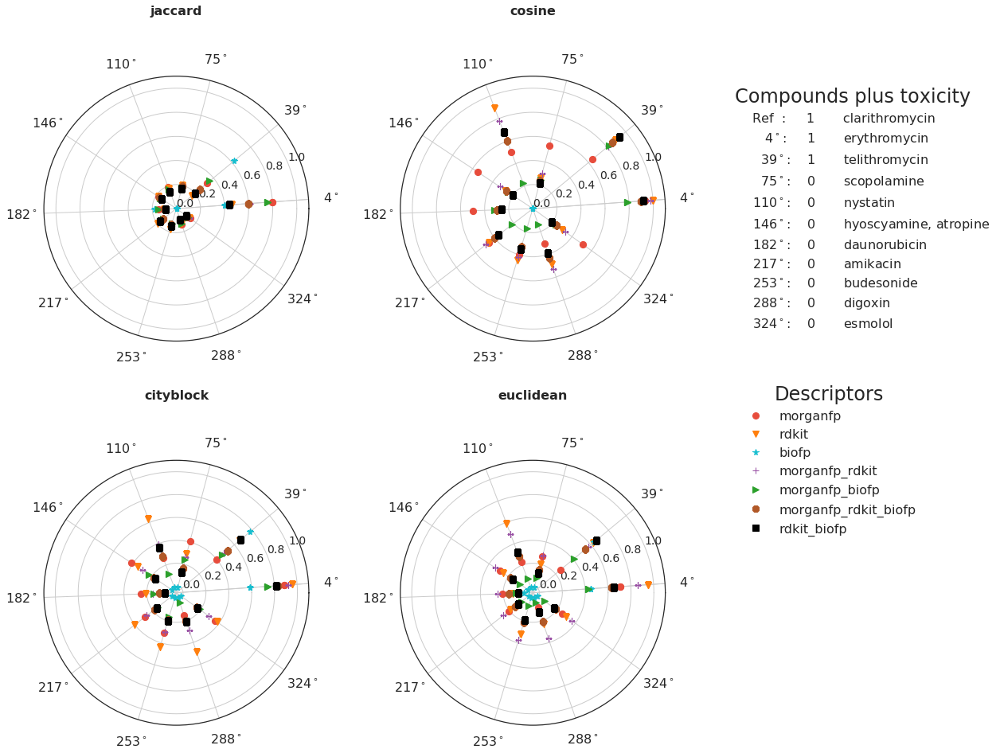

In [1548]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'morganfp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


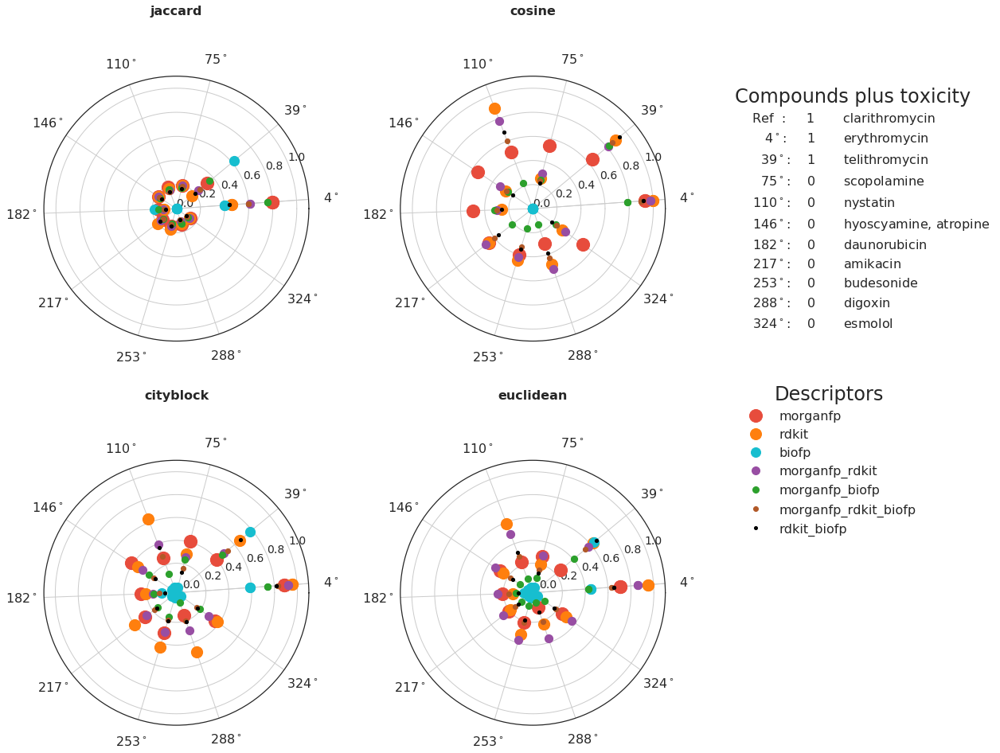

In [1554]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'morganfp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.2 Jaccard RDKIT nortriptyline	

In [1555]:
kk = simDF.sort_values(by='jaccard_rdkit', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
28318,JWZZKOKVBUJMES-ARLVXYFGNA-O,LMOINURANNBYCM-ARLVXYFGNA-O,,,Comb,R,COMBINATION,RESPIRATORY SYSTEM,14,11,isoprenaline,orciprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
23800,LMOINURANNBYCM-ARLVXYFGNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,R,Comb,RESPIRATORY SYSTEM,COMBINATION,11,14,orciprenaline,isoprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
38074,BWPIARFWQZKAIA-WXAGKSDWNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,protriptyline,nortriptyline,0.0,1.0,0.285131,0.705357,0.2,0.604473,0.274554,0.591662,0.683390,0.502674,0.968393,0.228243,0.810249,0.354489,0.590044,0.617214,0.643426,0.992908,0.0,0.821424,0.503485,0.636048,0.675533,0.716624,0.982194,0.516398,0.857810,0.639074,0.795354,0.849690
5695,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,BWPIARFWQZKAIA-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,nortriptyline,protriptyline,1.0,0.0,0.285131,0.705357,0.2,0.604473,0.274554,0.591662,0.683390,0.502674,0.968393,0.228243,0.810249,0.354489,0.590044,0.617214,0.643426,0.992908,0.0,0.821424,0.503485,0.636048,0.675533,0.716624,0.982194,0.516398,0.857810,0.639074,0.795354,0.849690
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
28419,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,LMOINURANNBYCM-ARLVXYFGNA-O,,
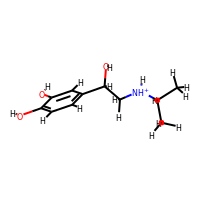
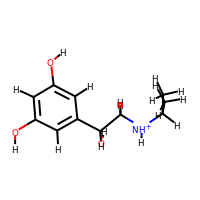
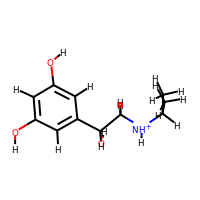
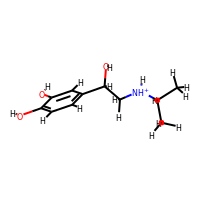
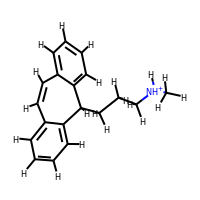
...
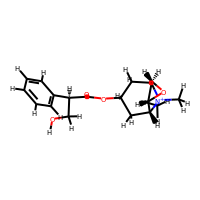
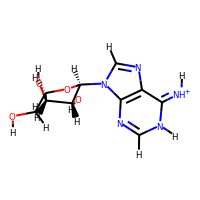
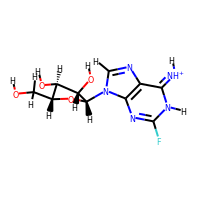
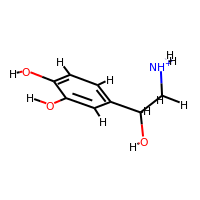
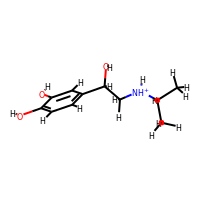

In [1556]:
kk.head(20)

In [1557]:
drugdf = simDF[simDF.atc_names_target.isin(['nortriptyline'])]

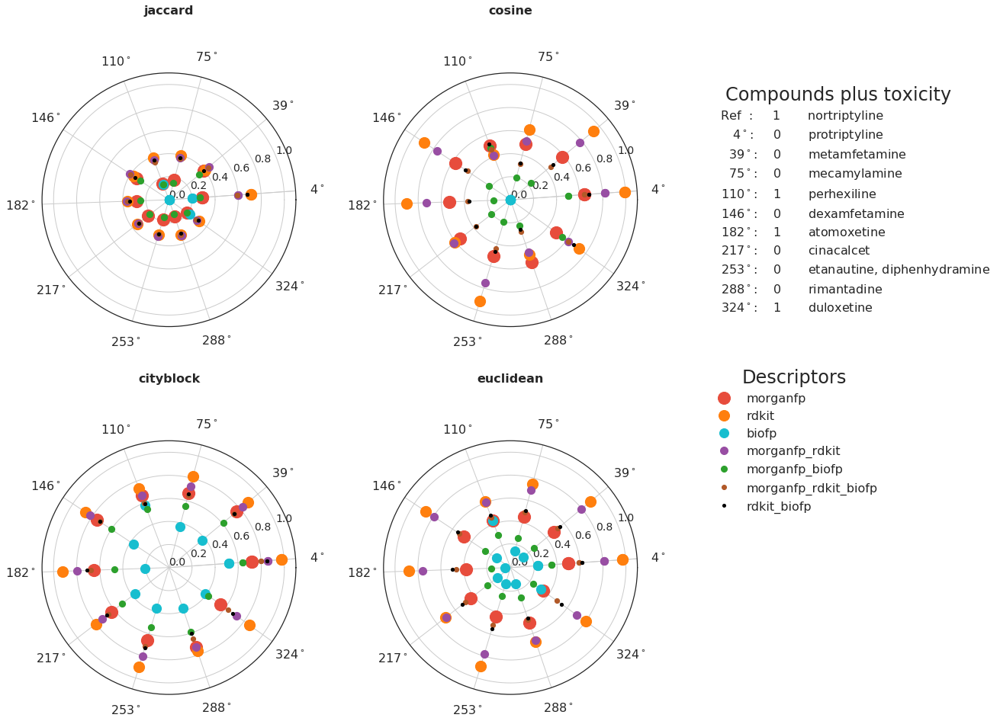

In [1558]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'rdkit'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.3 Jaccard biofingerprints quazepam

In [1559]:
kk = simDF.sort_values(by='jaccard_biofp', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
20371,VMWNQDUVQKEIOC-HWGXLWBYNA-O,IKMPWMZBZSAONZ-UHFFFAOYNA-N,,,Comb,N,COMBINATION,NERVOUS SYSTEM,14,9,apomorphine,quazepam,0.0,0.0,0.039352,0.098214,1.0,0.086078,0.039352,0.089353,0.111327,0.195118,0.079109,1.0,0.141788,0.564775,0.223327,0.217764,0.103424,0.152126,0.0,0.106573,0.156421,0.084048,0.116953,0.311954,0.264840,1.0,0.259775,0.505249,0.373819,0.383324
29449,WIIZWVCIJKGZOK-DTKKNENENA-N,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,Comb,C,COMBINATION,CARDIOVASCULAR SYSTEM,14,2,chloramphenicol,regadenoson,0.0,0.0,0.116443,0.026786,1.0,0.063873,0.116443,0.067227,0.040937,0.126348,0.337659,1.0,0.346200,0.535730,0.401912,0.449906,0.252572,0.194845,0.0,0.179199,0.297099,0.171775,0.203764,0.200807,0.370695,1.0,0.257154,0.424272,0.374119,0.517221
54804,MECHNRXZTMCUDQ-VLOQVYPSNA-N,WIIZWVCIJKGZOK-DTKKNENENA-N,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,ergocalciferol,chloramphenicol,0.0,0.0,0.047256,0.107143,1.0,0.103932,0.047256,0.107143,0.120126,0.326262,0.408381,1.0,0.428379,0.638486,0.434697,0.383521,0.324809,0.292730,0.0,0.238302,0.373649,0.196530,0.220337,0.441405,0.455977,1.0,0.431770,0.602224,0.492887,0.487838
29431,ULFRLSNUDGIQQP-FRPNKZSKNA-O,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,N,C,NERVOUS SYSTEM,CARDIOVASCULAR SYSTEM,9,2,rizatriptan,regadenoson,0.0,0.0,0.066667,0.080357,1.0,0.055865,0.066667,0.059248,0.093730,0.043014,0.643707,1.0,0.517240,0.493188,0.561021,0.710097,0.232256,0.754883,0.0,0.516844,0.269399,0.439997,0.547368,0.068069,0.609230,1.0,0.317464,0.345973,0.423210,0.684630
29433,UNISKOOZAQCSPC-VXKMTNQYNA-N,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,Comb,C,COMBINATION,CARDIOVASCULAR SYSTEM,14,2,budesonide,regadenoson,0.0,0.0,0.054487,0.026786,1.0,0.019404,0.054487,0.022918,0.040937,0.121567,0.316638,1.0,0.351182,0.544528,0.443045,0.505873,0.253063,0.021796,0.0,0.060642,0.324900,0.068101,0.016306,0.123324,0.301906,1.0,0.173068,0.394912,0.318492,0.479175
29434,UOZODPSAJZTQNH-CLDBIRNENA-P,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,A,C,ALIMENTARY TRACT AND METABOLISM,CARDIOVASCULAR SYSTEM,0,2,paromomycin,regadenoson,0.0,0.0,0.087532,0.071429,1.0,0.059539,0.087532,0.062908,0.084931,0.154051,0.259736,1.0,0.269266,0.556167,0.349206,0.456649,0.337858,0.279783,0.0,0.274749,0.394638,0.309426,0.372997,0.206668,0.228106,1.0,0.137690,0.444506,0.265521,0.415782
29435,UPNUIXSCZBYVBB-DNQVHHGPNA-N,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,A,C,ALIMENTARY TRACT AND METABOLISM,CARDIOVASCULAR SYSTEM,0,2,alvimopan,regadenoson,0.0,0.0,0.080404,0.008929,1.0,0.026018,0.080404,0.029508,0.023340,0.015929,0.162780,1.0,0.222183,0.477339,0.317624,0.360156,0.176696,0.010861,0.0,0.015307,0.234883,0.000879,-0.056868,0.018303,0.173299,1.0,0.051862,0.299823,0.210266,0.363443
54808,MKXZASYAUGDDCJ-GNLLWOQMNA-O,WIIZWVCIJKGZOK-DTKKNENENA-N,,,R,Comb,RESPIRATORY SYSTEM,COMBINATION,11,14,dextromethorphan,chloramphenicol,0.0,0.0,0.055233,0.071429,1.0,0.082263,0.055233,0.085551,0.084931,0.190663,0.287914,1.0,0.318801,0.549951,0.344455,0.317015,0.116763,0.113821,0.0,0.069667,0.158080,0.039805,0.067504,0.355987,0.436658,1.0,0.379009,0.522090,0.449907,0.469597
29436,UQRORFVVSGFNRO-XQVXOGQSNA-O,LZPZPHGJDAGEJZ-FGCXFHCRNA-O,,,A,C,ALIMENTARY TRACT AND METABOLISM,CARDIOVASCULAR SYSTEM
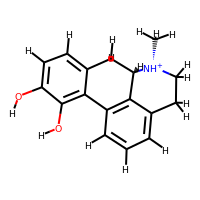
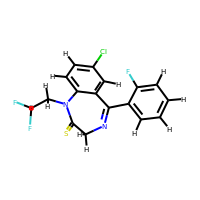
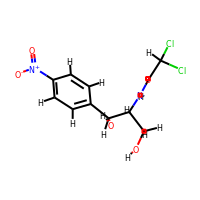
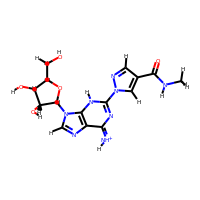
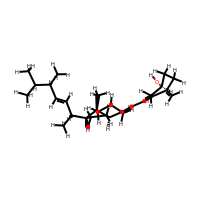
...
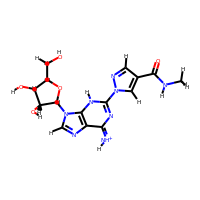
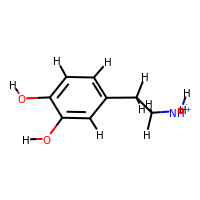
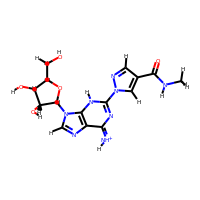
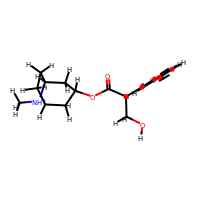
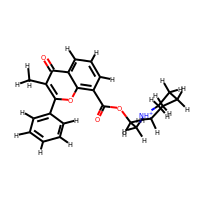

In [1560]:
kk.head(20)

In [1561]:
drugdf = simDF[simDF.atc_names_target.isin(['quazepam'])]

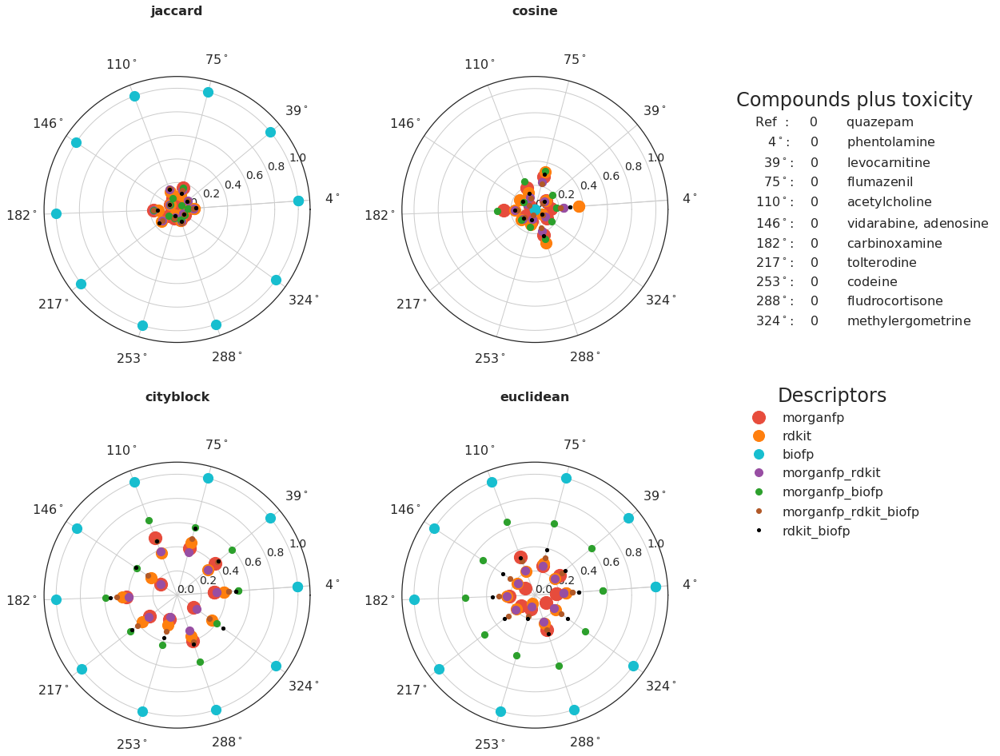

In [1562]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'biofp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.4 Jaccard morganfp + RDKIT orciprenaline

In [1563]:
kk = simDF.sort_values(by='jaccard_morganfp_rdkit', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
28318,JWZZKOKVBUJMES-ARLVXYFGNA-O,LMOINURANNBYCM-ARLVXYFGNA-O,,,Comb,R,COMBINATION,RESPIRATORY SYSTEM,14,11,isoprenaline,orciprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
23800,LMOINURANNBYCM-ARLVXYFGNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,R,Comb,RESPIRATORY SYSTEM,COMBINATION,11,14,orciprenaline,isoprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
61719,XNOPRXBHLZRZKH-ORQPBDEFNA-N,ZDRRIRUAESZNIH-OBSLRLEHNA-N,,,H,G,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",GENITO URINARY SYSTEM AND SEX HORMONES,5,4,oxytocin,urofollitropin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
58456,ZDRRIRUAESZNIH-OBSLRLEHNA-N,XNOPRXBHLZRZKH-ORQPBDEFNA-N,,,G,H,GENITO URINARY SYSTEM AND SEX HORMONES,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",4,5,urofollitropin,oxytocin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0
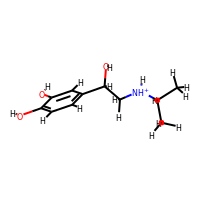
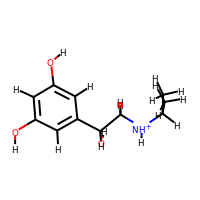
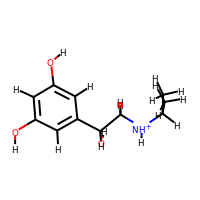
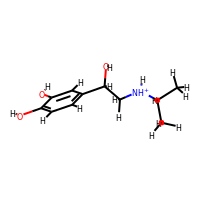
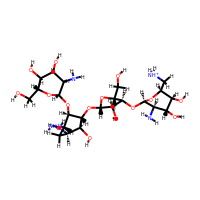
...
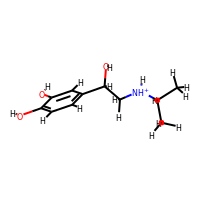
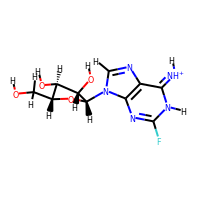
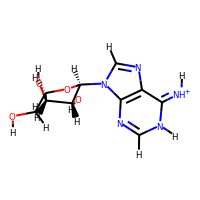
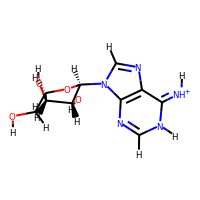
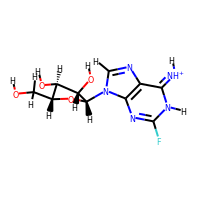

In [1564]:
kk.head(20)

In [1574]:
drugdf = simDF[simDF.atc_names_target.isin(['orciprenaline'])]

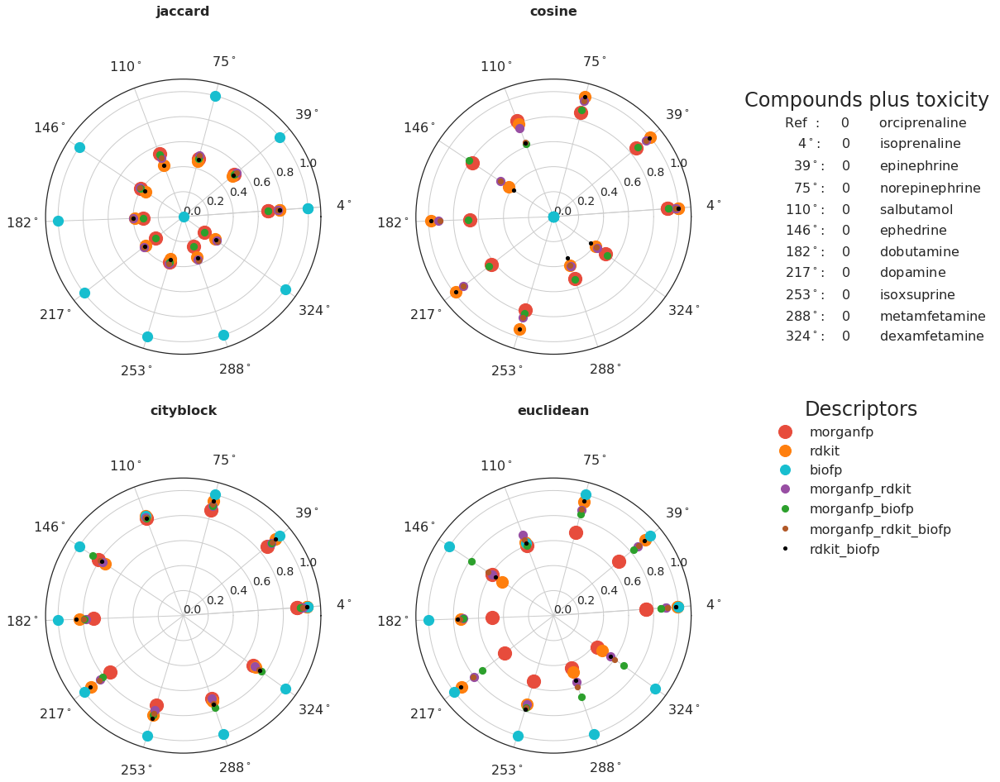

In [1575]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'morganfp_rdkit'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.5 Jaccard morganfp + biofp oxytocin

In [1567]:
kk = simDF.sort_values(by='jaccard_morganfp_biofp', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
58456,ZDRRIRUAESZNIH-OBSLRLEHNA-N,XNOPRXBHLZRZKH-ORQPBDEFNA-N,,,G,H,GENITO URINARY SYSTEM AND SEX HORMONES,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",4,5,urofollitropin,oxytocin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
61719,XNOPRXBHLZRZKH-ORQPBDEFNA-N,ZDRRIRUAESZNIH-OBSLRLEHNA-N,,,H,G,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",GENITO URINARY SYSTEM AND SEX HORMONES,5,4,oxytocin,urofollitropin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
49322,SFLSHLFXELFNJZ-HXOWBQAONA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,C,Comb,CARDIOVASCULAR SYSTEM,COMBINATION,2,14,norepinephrine,epinephrine,0.0,0.0,0.821429,0.500000,1.0,0.612155,0.821429,0.613544,0.507271,0.909157,0.952484,1.000000,0.940801,0.948245,0.936759,0.948911,0.988617,0.996835,0.0,0.992532,0.988322,0.989547,0.994663,0.982158,0.972565,1.000000,0.973086,0.984997,0.972821,0.971512
46059,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,SFLSHLFXELFNJZ-HXOWBQAONA-O,,,Comb,C,COMBINATION,CARDIOVASCULAR SYSTEM,14,2,epinephrine,norepinephrine,0.0,0.0,0.821429,0.500000,1.0,0.612155,0.821429,0.613544,0.507271,0.909157,0.952484,1.000000,0.940801,0.948245,0.936759,0.948911,0.988617,0.996835,0.0,0.992532,0.988322,0.989547,0.994663,0.982158,0.972565,1.000000,0.973086,0.984997,0.972821,0.971512
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.9563
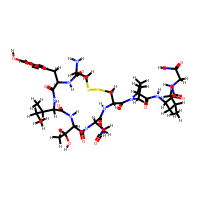
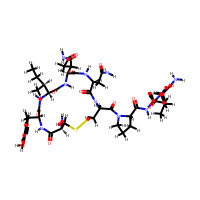
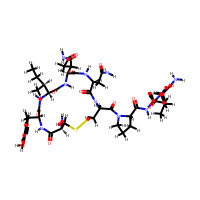
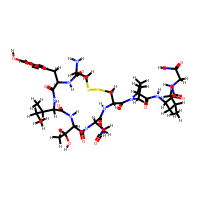
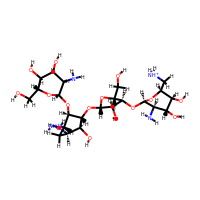
...
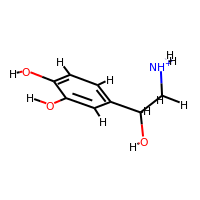
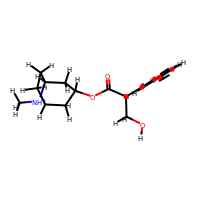
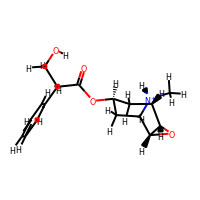
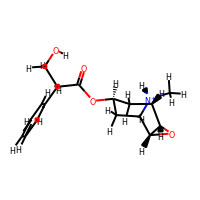
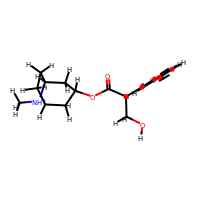

In [1568]:
kk.head(20)

In [1569]:
drugdf = simDF[simDF.atc_names_target.isin(['oxytocin'])]

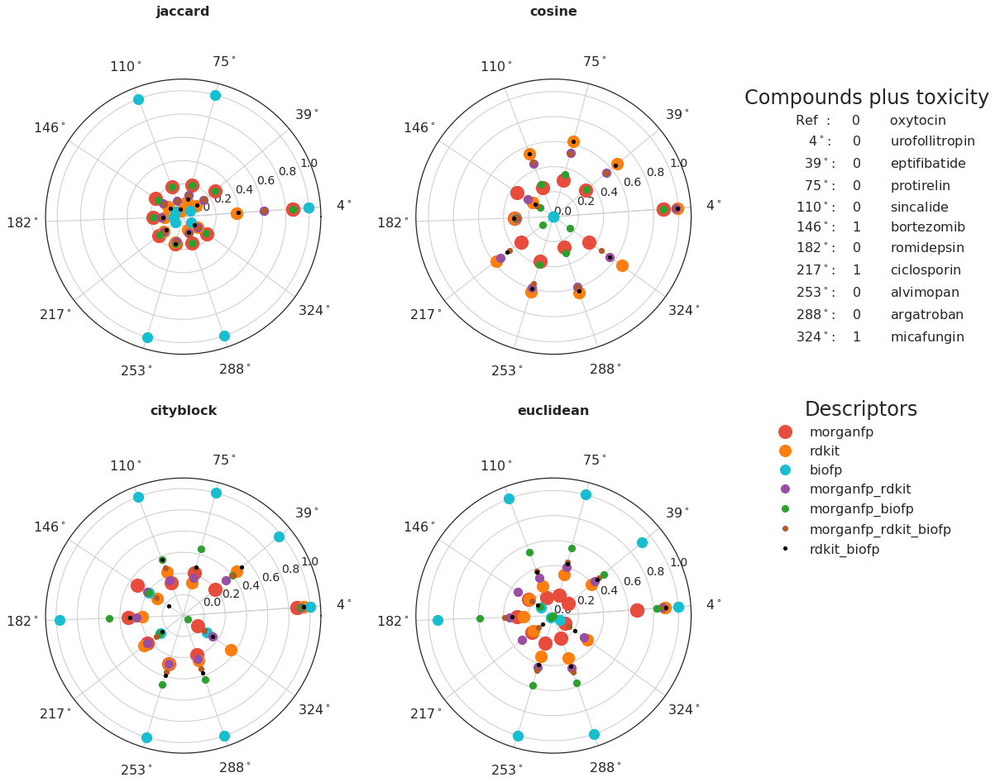

In [1572]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'morganfp_biofp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.6 Jaccard morganfp + rdkit + biofp orciprenaline

In [1576]:
kk = simDF.sort_values(by='jaccard_morganfp_rdkit_biofp', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
28318,JWZZKOKVBUJMES-ARLVXYFGNA-O,LMOINURANNBYCM-ARLVXYFGNA-O,,,Comb,R,COMBINATION,RESPIRATORY SYSTEM,14,11,isoprenaline,orciprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
23800,LMOINURANNBYCM-ARLVXYFGNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,R,Comb,RESPIRATORY SYSTEM,COMBINATION,11,14,orciprenaline,isoprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
58456,ZDRRIRUAESZNIH-OBSLRLEHNA-N,XNOPRXBHLZRZKH-ORQPBDEFNA-N,,,G,H,GENITO URINARY SYSTEM AND SEX HORMONES,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",4,5,urofollitropin,oxytocin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0.982370,0.992293,0.882794,0.935566,1.000000,0.917577,0.919354,0.929493,0.942893
61719,XNOPRXBHLZRZKH-ORQPBDEFNA-N,ZDRRIRUAESZNIH-OBSLRLEHNA-N,,,H,G,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",GENITO URINARY SYSTEM AND SEX HORMONES,5,4,oxytocin,urofollitropin,0.0,0.0,0.863707,0.383929,1.0,0.612419,0.863707,0.613808,0.392887,0.670166,0.890278,1.000000,0.872959,0.825114,0.884290,0.900828,0.876856,0.992739,0.0,0.981700,0.883948,0
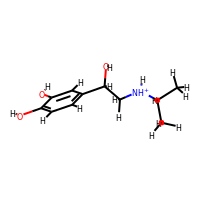
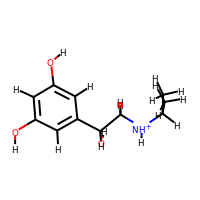
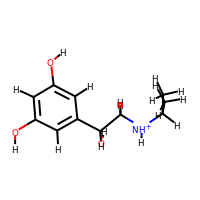
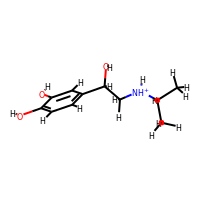
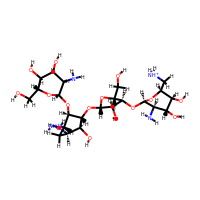
...
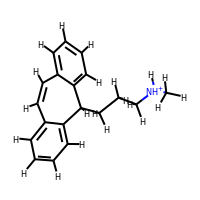
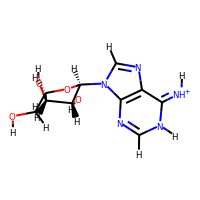
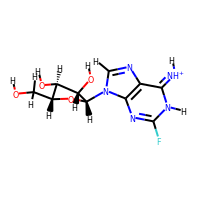
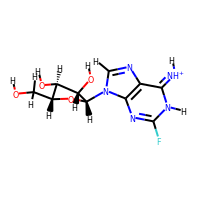
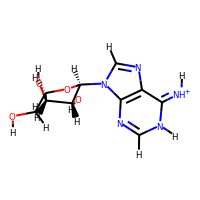

In [1577]:
kk.head(20)

In [1578]:
drugdf = simDF[simDF.atc_names_target.isin(['orciprenaline'])]

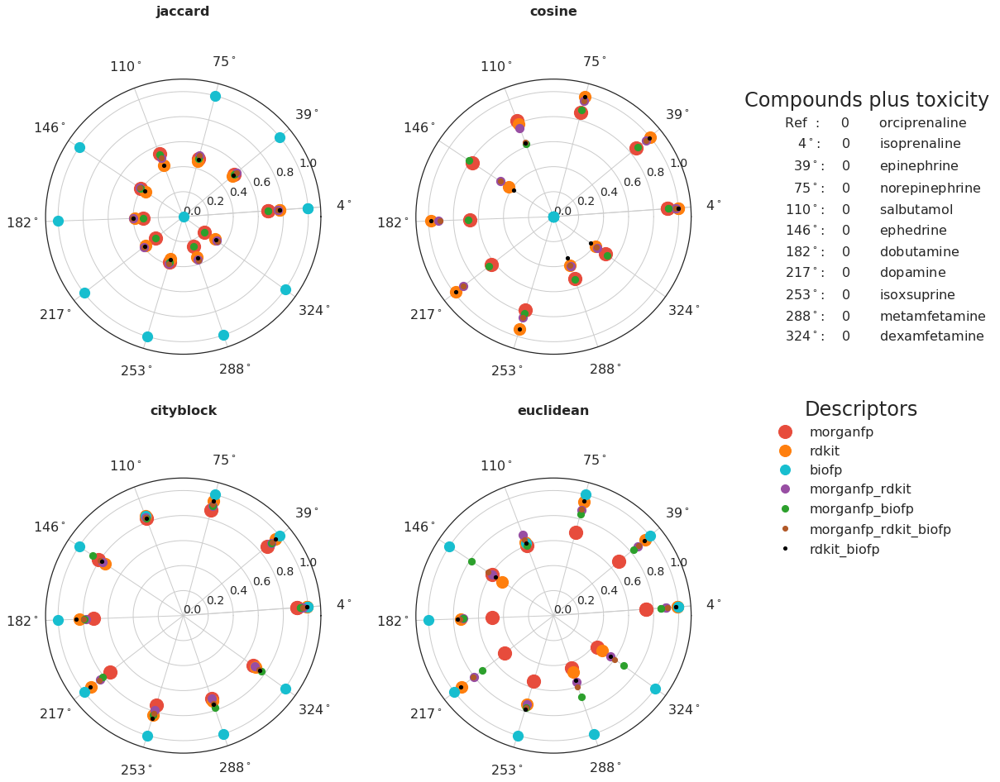

In [1579]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'morganfp_rdkit_biofp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


# 3.7 Jaccard  rdkit + biofp nortriptyline

In [1580]:
kk = simDF.sort_values(by='jaccard_rdkit_biofp', ascending=False)

,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
23800,LMOINURANNBYCM-ARLVXYFGNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,R,Comb,RESPIRATORY SYSTEM,COMBINATION,11,14,orciprenaline,isoprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
28318,JWZZKOKVBUJMES-ARLVXYFGNA-O,LMOINURANNBYCM-ARLVXYFGNA-O,,,Comb,R,COMBINATION,RESPIRATORY SYSTEM,14,11,isoprenaline,orciprenaline,0.0,0.0,0.677579,0.767857,1.0,0.763831,0.677579,0.764677,0.771233,0.743683,0.988694,1.000000,0.899871,0.864746,0.907927,0.977184,0.912439,0.999816,0.0,0.978129,0.922201,0.977182,0.998907,0.913881,0.994521,1.000000,0.955263,0.940922,0.961863,0.991523
38074,BWPIARFWQZKAIA-WXAGKSDWNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,protriptyline,nortriptyline,0.0,1.0,0.285131,0.705357,0.2,0.604473,0.274554,0.591662,0.683390,0.502674,0.968393,0.228243,0.810249,0.354489,0.590044,0.617214,0.643426,0.992908,0.0,0.821424,0.503485,0.636048,0.675533,0.716624,0.982194,0.516398,0.857810,0.639074,0.795354,0.849690
5695,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,BWPIARFWQZKAIA-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,nortriptyline,protriptyline,1.0,0.0,0.285131,0.705357,0.2,0.604473,0.274554,0.591662,0.683390,0.502674,0.968393,0.228243,0.810249,0.354489,0.590044,0.617214,0.643426,0.992908,0.0,0.821424,0.503485,0.636048,0.675533,0.716624,0.982194,0.516398,0.857810,0.639074,0.795354,0.849690
49234,JWZZKOKVBUJMES-ARLVXYFGNA-O,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,isoprenaline,epinephrine,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
23883,UCTWMZQNUQWSLP-ZVVSCSQLNA-O,JWZZKOKVBUJMES-ARLVXYFGNA-O,,,Comb,Comb,COMBINATION,COMBINATION,14,14,epinephrine,isoprenaline,0.0,0.0,0.808114,0.553571,1.0,0.648408,0.808114,0.649668,0.560063,0.806408,0.949394,1.000000,0.917402,0.898144,0.920123,0.947371,0.950446,0.996341,0.0,0.985222,0.956395,0.982992,0.994212,0.955763,0.963846,1.000000,0.956272,0.967861,0.959081,0.965805
51053,PGBHMTALBVVCIT-DXHAPIGYNA-P,UOZODPSAJZTQNH-CLDBIRNENA-P,,,Comb,A,COMBINATION,ALIMENTARY TRACT AND METABOLISM,14,0,"neomycin, framycetin",paromomycin,0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
37750,UOZODPSAJZTQNH-CLDBIRNENA-P,PGBHMTALBVVCIT-DXHAPIGYNA-P,,,A,Comb,ALIMENTARY TRACT AND METABOLISM,COMBINATION,0,14,paromomycin,"neomycin, framycetin",0.0,0.0,0.833937,0.535714,1.0,0.660368,0.833937,0.661585,0.542465,0.783342,0.947746,1.000000,0.908833,0.889775,0.917577,0.952918,0.944442,0.996972,0.0,0.990753,0.954658,0.991711,0.996745,0.927027,0.968887,1.000000,0.949531,0.952502,0.957635,0.972934
32361,KWTSXDURSIMDCE-GQNLNGBQNA-O,MYWUZJCMWCOHBA-KNKINJKHNA-O,,
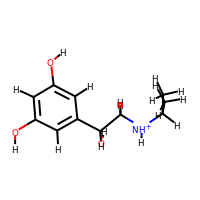
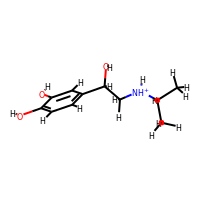
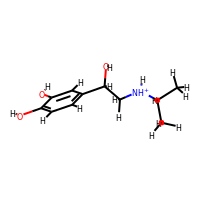
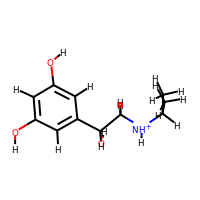
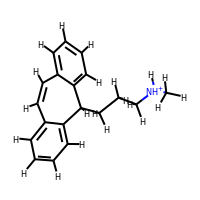
...
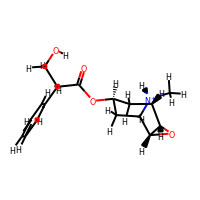
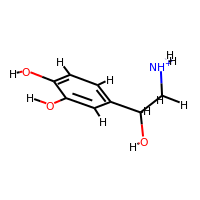
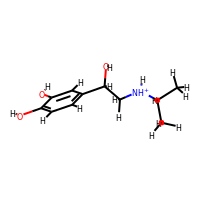
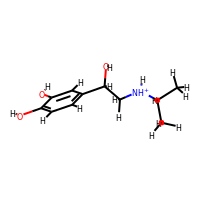
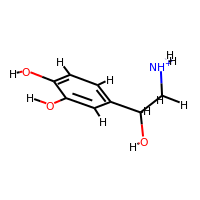

In [1581]:
kk.head(20)

In [1583]:
drugdf = simDF[simDF.atc_names_target.isin(['nortriptyline'])]

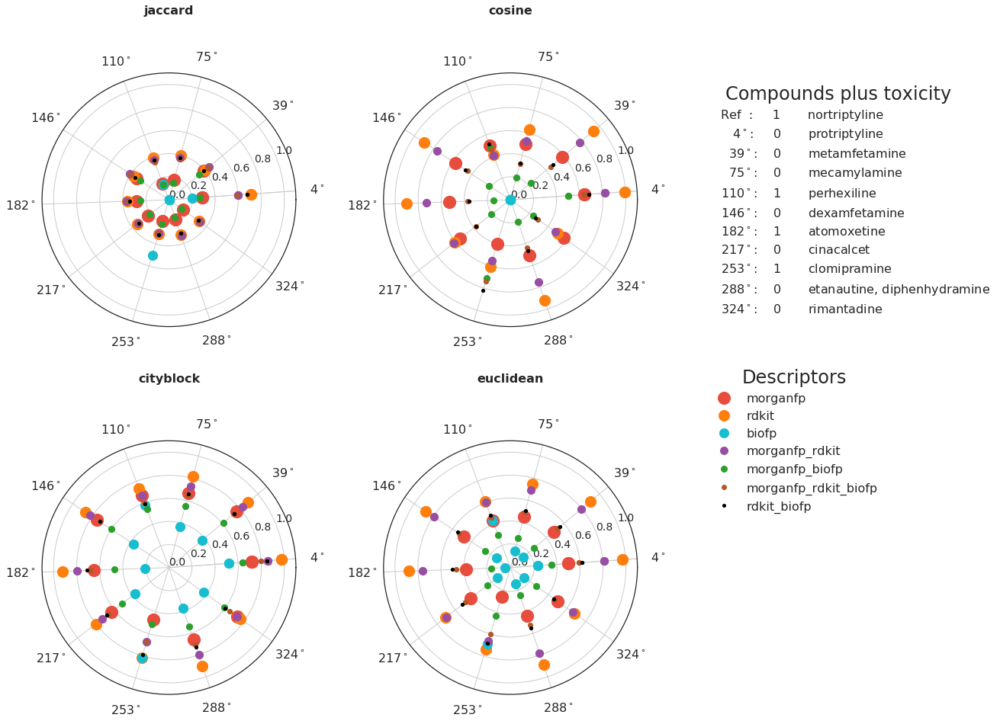

In [1584]:
# df = simDFsorted.copy()
snames = 'atc_names_source'
simcol = 'jaccard'
md = 'rdkit_biofp'
compoundf = getsimDF_filtered(drugdf, 0, 10, simcol+'_'+md, 'parent_nonstd_inkey_target')
dcols = dnames
refname = drugdf.atc_names_target.unique()[0]
radialplot(compoundf, refname, snames, dcols)


,parent_nonstd_inkey_source,parent_nonstd_inkey_target,mol3DProt_source,mol3DProt_target,cat_label_source,cat_label_target,cat_description_source,cat_description_target,cat_num_source,cat_num_target,atc_names_source,atc_names_target,vDILI_source,vDILI_target,jaccard_morganfp,jaccard_rdkit,jaccard_biofp,jaccard_morganfp_rdkit,jaccard_morganfp_biofp,jaccard_morganfp_rdkit_biofp,jaccard_rdkit_biofp,euclidean_morganfp,euclidean_rdkit,euclidean_biofp,euclidean_morganfp_rdkit,euclidean_morganfp_biofp,euclidean_morganfp_rdkit_biofp,euclidean_rdkit_biofp,cosine_morganfp,cosine_rdkit,cosine_biofp,cosine_morganfp_rdkit,cosine_morganfp_biofp,cosine_morganfp_rdkit_biofp,cosine_rdkit_biofp,cityblock_morganfp,cityblock_rdkit,cityblock_biofp,cityblock_morganfp_rdkit,cityblock_morganfp_biofp,cityblock_morganfp_rdkit_biofp,cityblock_rdkit_biofp
0,BWPIARFWQZKAIA-WXAGKSDWNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,protriptyline,nortriptyline,0.0,1.0,0.285131,0.705357,0.200000,0.604473,0.274554,0.591662,0.683390,0.502674,0.968393,0.228243,0.810249,0.354489,0.590044,0.617214,0.643426,0.992908,0.0,0.821424,0.503485,0.636048,0.675533,0.716624,0.982194,0.516398,0.857810,0.639074,0.795354,0.849690
1,MYWUZJCMWCOHBA-KNKINJKHNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,metamfetamine,nortriptyline,0.0,1.0,0.390244,0.410714,0.000000,0.452494,0.343297,0.437060,0.392452,0.478977,0.895614,0.137642,0.794027,0.262199,0.529068,0.551797,0.578068,0.925494,0.0,0.775814,0.227276,0.453371,0.477359,0.760306,0.894249,0.367593,0.833247,0.605459,0.734941,0.734778
2,IMYZQPCYWPFTAG-QUZPRJFPNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,C,N,CARDIOVASCULAR SYSTEM,NERVOUS SYSTEM,2,9,mecamylamine,nortriptyline,0.0,1.0,0.175347,0.401786,0.000000,0.381116,0.154874,0.368012,0.383895,0.449298,0.750177,0.137642,0.692984,0.258571,0.486108,0.505231,0.498447,0.627346,0.0,0.528849,0.202039,0.322990,0.325928,0.671291,0.815646,0.367593,0.730381,0.549085,0.652851,0.663655
3,CYXKNKQEMFBLER-YIWYKOSZNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,C,N,CARDIOVASCULAR SYSTEM,NERVOUS SYSTEM,2,9,perhexiline,nortriptyline,1.0,1.0,0.149660,0.392857,0.142857,0.366250,0.144345,0.353464,0.373664,0.434115,0.609972,0.433140,0.600937,0.300706,0.458654,0.481760,0.501434,0.422253,0.0,0.407750,0.478069,0.473788,0.516681,0.670074,0.730387,0.575181,0.674986,0.539614,0.602772,0.591135
4,KWTSXDURSIMDCE-GQNLNGBQNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,dexamfetamine,nortriptyline,0.0,1.0,0.339431,0.366071,0.000000,0.409911,0.298007,0.395580,0.349667,0.475204,0.877437,0.137642,0.785497,0.261214,0.525670,0.548099,0.573244,0.902339,0.0,0.764066,0.224565,0.447271,0.466838,0.751067,0.871836,0.367593,0.823014,0.599242,0.724045,0.719617
5,VHGCDTVCOLNTBX-FHACKCKMNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,atomoxetine,nortriptyline,1.0,1.0,0.280303,0.357143,0.000000,0.371208,0.248634,0.355942,0.336200,0.376990,0.884872,0.044440,0.759861,0.164789,0.470943,0.499421,0.533939,0.899015,0.0,0.732234,0.145651,0.367510,0.358843,0.645543,0.918157,0.208406,0.801792,0.467442,0.683985,0.708871
6,VDHAWDNDOKGFTD-CFFNLDLKNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,H,N,"SYSTEMIC HORMONAL PREPARATIONS, EXCL. SEX HORMONES AND INSULINS",NERVOUS SYSTEM,5,9,cinacalcet,nortriptyline,0.0,1.0,0.227151,0.348214,0.000000,0.339684,0.207090,0.328454,0.332553,0.428385,0.711974,0.137642,0.700623,0.250547,0.493371,0.515535,0.545458,0.613213,0.0,0.623416,0.212220,0.379049,0.381245,0.627437,0.804111,0.367593,0.733801,0.506620,0.655461,0.676651
7,GDLIGKIOYRNHDA-DFPVKJBZNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-O,,,N,N,NERVOUS SYSTEM,NERVOUS SYSTEM,9,9,clomipramine,nortriptyline,1.0,1.0,0.191542,0.312500,0.500000,0.298864,0.215183,0.302286,0.319179,0.264393,0.738914,0.693839,0.662731,0.428527,0.599032,0.679427,0.404398,0.612892,0.0,0.550731,0.714256,0.735478,0.819135,0.471369,0.823807,0.821781,0.669912,0.513546,0.666296,0.787852
8,ZZVUWRFHKOJYTH-AXHCDRICNA-O,PHVGLTMQBUFIQQ-WXAGKSDWNA-
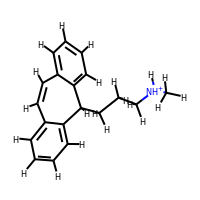
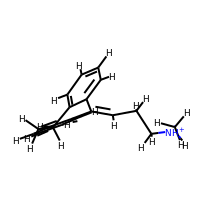
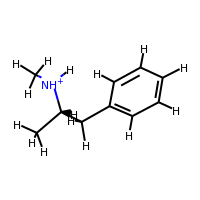
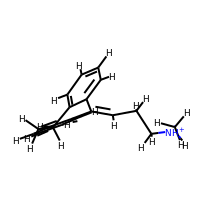
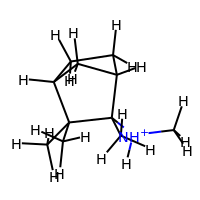
...
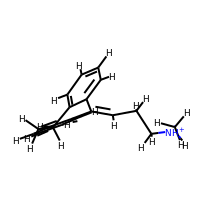
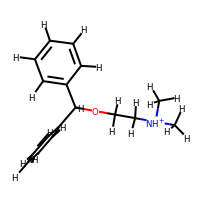
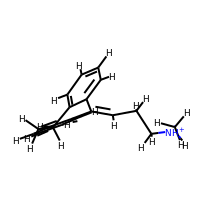
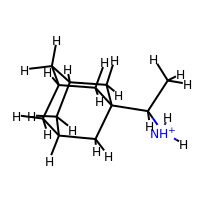
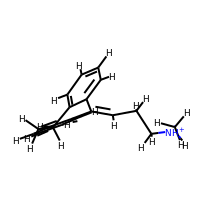

In [1588]:
compoundf